# Introduction

Flow cytometry measures multiple physical and fluorescence properties for individual cells. Each row in the dataset corresponds to a single cellular event, while each column corresponds to a measurement channel.

The objective of this notebook is to:
- load and inspect `.fcs` cytometry files
- reconstruct fluorescence compensation from single-stain controls
- explore signal distributions
- prepare the data for downstream machine learning analysis

# Setup

In [1]:
# follow your notebook's current theme
PLOTLY_THEME = 'white' # values: 'white', 'dark'

In [2]:
import sys
if not sys.version.startswith('3.11'):
    print('\x1b[91mWarning: this code is compatible with flowkit 1.3.2, which can be incompatible with python versions other than 3.11')

## Imports

You can run the command in `pip install -r requirements.txt` in your terminal to ensure that the library required are installed

In [3]:
import flowkit as fk
from flowkit._models.sample import Sample # for typing

In [4]:
from IPython.display import display, Markdown, Math

In [5]:
from scipy.stats import linregress
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import umap

D:\projects\cyto2\venv3.11\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [7]:
import os
import sys
import pandas as pd
import numpy as np
from pandas import DataFrame # for typing
from pathlib import Path
import math
import warnings
import tqdm

# Data

## Description

The dataset contains:
- experimental Peripheral Blood Mononuclear Cell (PBMC) samples
- fluorescence compensation controls
- acquisition metadata stored in `.fcs` files

The compensation controls are single-stain samples: each file contains cells stained with only one fluorochrome. These controls allow estimation of spectral spillover between fluorescence channels.

All data was extracted from [https://community.cytobank.org/cytobank/experiments/48231](https://community.cytobank.org/cytobank/experiments/48231)

## Configurable parameters

Some global parameters can be adjusted to modify the behavior of the notebook:

- `N_CELLS`: Maximum number of cellular events retained for exploratory analysis and machine learning. Large cytometry datasets can contain millions of cells, so subsampling is often required for computationally intensive methods such as UMAP

- `IGNORED_COLUMNS`: List of channels excluded from downstream analysis. Technical acquisition channels such as `Time`, `FSC`, or `SSC` may sometimes be removed depending on the biological objective of the analysis

In [8]:
N_CELLS = 50_000

In [51]:
# columns to ignore for analysis
IGNORED_COLUMNS = [
    'Time', 'time',
    # let's not consider cell size considerations here
    'FSC-A',
    'SSC-A',
]

## Loading samples

The `.fcs` files are loaded using FlowKit. Experimental samples and compensation controls are separated automatically based on filename conventions.

Some files contain different metadata annotations (`pnn` and `pns` channel labels), so channel names must be normalized before combining datasets.

In [10]:
# helpers

def flatten_df(df, inplace=False):
    if not inplace:
        df = df.copy()
    df.columns = [(pnn.strip().strip()+'_'+pns.strip()).strip() for pnn, pns in df.columns]
    return df

def drop_pns(df, inplace=False):
    if not inplace:
        df = df.copy()
    df.columns = [pnn for pnn, pns in df.columns]
    return df

In [11]:
def load_sample_files(directory: str|Path) -> dict:
    directory = Path(directory)
    fcs_files = list(directory.glob('*.fcs'))
    sample_files = {}
    known_columns = {}
    for filepath in fcs_files:
        filename = filepath.stem.lower()
        filepath = str(filepath)
        sample = fk.Sample(filepath)
        known_columns.setdefault(tuple(sorted(sample.pnn_labels)), []).append(filepath)
        sample_files[filename] = sample
    if len(known_columns) > 1:
        warnings.warn(
            f'Not all samples have the same column set ({len(known_columns)} different column sets found)\n' + \
            '\n'.join(
                f'{list(cols)}: {len(known_columns[cols])}'
                for cols in known_columns
            )
        )
    return sample_files

In [12]:
all_files = load_sample_files('data')
xps = {path: sample for path, sample in all_files.items() if path.startswith('pbmc_')}
comps = {path: sample for path, sample in all_files.items() if path.startswith('comp_')}
assert len(xps), 'No experiments detected in data folder'

## Compensation

Fluorochromes are not spectrally independent. A fluorescence signal emitted by one fluorochrome may partially appear in another acquisition channel, a phenomenon known as spectral spillover.

Compensation estimates this spillover and subtracts it mathematically from affected channels.

Although the experiment files contain compensation metadata, the stored matrices are effectively identity matrices in this dataset. Compensation is therefore reconstructed manually from the single-stain control samples.

In [85]:
def reduce_name(name: str) -> str:
    if name.endswith('-A'):
        name = name[:-2]
    name = name.lower()
    if name.startswith('alexa'): # "alexa" can be shorten "ax" (in the comps they are but not in xp files)
        name = 'ax' + name[5:]
    return ''.join(c for c in name if c.isalnum())

def compensate_experiment(
        sample: Sample, 
        compensation_samples: dict[str|Path, DataFrame],
    ) -> DataFrame:
    # To-do: handle multiple samples at a time so the compensation files are handled just once
    
    # use metadata compensation as if available
    sample_df = drop_pns(sample.as_dataframe(source='raw'))
    if 'spill' in sample.metadata:
        sample.apply_compensation(sample.metadata['spill'])
        sample_comp_df = drop_pns(sample.as_dataframe(source='comp'))
        if (sample_df.values != sample_comp_df.values).any():
            return sample_comp_df
        meta_comped_df = None
        
    # mapping to restore original column names later
    sample_col_reduction = {reduce_name(col): col for col in list(sample_df)}
    sample_df.columns = [reduce_name(col) for col in sample_df.columns]
    
    # find compensations over all single-stain compensation files
    for comp_path, comp_sample in compensation_samples.items():
        # get primary channel from filename
        reduced_primary_col = reduce_name(os.path.basename(str(comp_path))[5:-4])
        # if the target channel exists in the sample
        if reduced_primary_col in sample_df.columns:
            comp_df = drop_pns(comp_sample.as_dataframe(source='raw'))
            comp_df.columns = [reduce_name(col) for col in comp_df.columns]
            # estimate true signal magnitude in the primary channel
            primary_signal = comp_df[reduced_primary_col].median()
            if primary_signal == 0:
                continue
            # estimate spillover into all other channels
            for sample_col in sample_df.columns:
                if sample_col == reduced_primary_col:
                    continue
                spill = comp_df[sample_col].median() / primary_signal
                # subtract estimated spillover contribution
                sample_df[sample_col] = sample_df[sample_col] - spill * sample_df[reduced_primary_col]
            
    # restore original column names
    sample_df.columns = [sample_col_reduction[col] for col in sample_df.columns]
    return sample_df

def get_compensation_matrix(compensation_samples: dict[str | Path, Sample]) -> DataFrame:
    # store normalized compensation dataframes
    comp_dfs = {}
    all_channels = set()
    # load and normalize all compensation samples
    name_reduction = {}
    for comp_path, comp_sample in compensation_samples.items():
        # get primary channel from filename
        primary_col = reduce_name(os.path.basename(str(comp_path))[5:-4])
        comp_df = drop_pns(comp_sample.as_dataframe(source='raw'))
        name_reduction |= {reduce_name(col): col for col in comp_df.columns}
        comp_df.columns = [reduce_name(col) for col in comp_df.columns]
        comp_dfs[primary_col] = comp_df
        all_channels.update(comp_df.columns)
    all_channels = sorted(all_channels-set(IGNORED_COLUMNS))
    # initialize identity compensation matrix
    comp_matrix = pd.DataFrame(
        np.eye(len(all_channels)),
        index = all_channels,
        columns = all_channels,
    )
    # estimate spillovers for all compensation controls
    for primary_col, comp_df in comp_dfs.items():
        # if the primary channel is missing
        if primary_col not in comp_df.columns:
            continue
        # estimate true signal magnitude in the primary channel
        primary_signal = comp_df[primary_col].median()
        if primary_signal == 0:
            continue
        # estimate spillover into all other channels
        for target_col in all_channels:
            if target_col == primary_col:
                continue
            spill = comp_df[target_col].median() / primary_signal
            # fill spillover coefficient into compensation matrix
            comp_matrix.loc[target_col, primary_col] = spill
    comp_matrix.columns = [name_reduction[col] for col in comp_matrix.columns]
    comp_matrix.index = [name_reduction[col] for col in comp_matrix.index]
    return comp_matrix

## Combined dataset

The experimental samples are concatenated into a single dataset containing more than one million cellular events.

To keep exploratory analysis and future dimensionality reduction computationally manageable, a subset of cells is sampled for downstream analysis (size of the sampled dataset can be changed via `N_CELLS`)

In [86]:
dfs = []
features = None
for filepath, xp_sample in xps.items():
    name = os.path.basename(filepath)
    assert name.startswith('pbmc_lrs005_'), repr(name)
    df = compensate_experiment(xp_sample, comps)
    df = df.drop(columns=[col for col in IGNORED_COLUMNS if col in df])
    df_features = sorted(list(df))
    if features is None:
        features = df_features
    elif features != df_features:
        raise RuntimeError(f'not all experiments have the same set of features\n{features =    }\n{df_features = }')
    df['condition'] = name[len('pbmc_lrs005_'):] # adding condition form file name
    dfs.append(df)
    
full_data = pd.concat(dfs).dropna()
if len(full_data) > N_CELLS:
    data = full_data.sample(N_CELLS, random_state=42)
else:
    data = full_data
    
data.info()


<class 'pandas.core.frame.DataFrame'>
Index: 50000 entries, 302419 to 85542
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   FSC-W         50000 non-null  float64
 1   Ax488-A       50000 non-null  float64
 2   PE-A          50000 non-null  float64
 3   PE-TR-A       50000 non-null  float64
 4   PerCP-Cy55-A  50000 non-null  float64
 5   PE-Cy7-A      50000 non-null  float64
 6   Ax647-A       50000 non-null  float64
 7   Ax700-A       50000 non-null  float64
 8   Ax750-A       50000 non-null  float64
 9   PacBlu-A      50000 non-null  float64
 10  Qdot525-A     50000 non-null  float64
 11  PacOrange-A   50000 non-null  float64
 12  Qdot605-A     50000 non-null  float64
 13  Qdot655-A     50000 non-null  float64
 14  Qdot705-A     50000 non-null  float64
 15  condition     50000 non-null  object 
dtypes: float64(15), object(1)
memory usage: 6.5+ MB


## Visualization

### Spillover

In a single-stain control, only one fluorescence channel should contain a strong biological signal.

If another fluorescence channel correlates with the primary signal, this suggests spectral spillover between the two channels.

In [87]:
def plot_spillover(
        sample: DataFrame|Sample,
        primary_channel: str = None,
        spill_channel: str = None,
        n: int = 2000,
        title: str = False,
        show: bool = True,
    ) -> go.Figure|None:
    
    if isinstance(sample, DataFrame):
        df = sample
    else:
        df = drop_pns(sample.as_dataframe(source='raw'))
    if primary_channel is None:
        primary_channel = list(df)[0]
    if spill_channel is None:
        spill_channel = list(df)[1]
    
    regress = linregress(df[primary_channel], df[spill_channel])
    
    plot_df = df.sample(min(n, len(df)), random_state=42)
    fig = go.Figure()
    fig.add_trace(
        go.Scattergl( 
            x = plot_df[primary_channel], 
            y = plot_df[spill_channel],
            mode = 'markers',
            marker = dict(
                size = 8,
                opacity = 0.5,
            ),
            showlegend = False,
        )
    )
    fig.update_layout(
        title =  (
            (title or f'{primary_channel} spillover into {spill_channel}') + \
            f' (slope = {regress.slope:.4f}, r = {regress.rvalue:.4f})'
        ),
        xaxis_title = primary_channel,
        yaxis_title = spill_channel,
        template = f'plotly_{PLOTLY_THEME}',
        height = 700
    )
    if show:
        fig.show()
    else:
        return fig

As a simple illustrative example of fluorescence spillover, the relationship between two acquisition channels is visualized below using a single-stain compensation control sample.

In [88]:
comp_sample = list(comps.values())[0]
primary_channel, spill_channel = comp_sample.pnn_labels[:2]#3], comp_sample.pnn_labels[7]
plot_spillover(comp_sample, primary_channel, spill_channel) 

The relationship between the two channels shows partial signal association, although the correlation remains relatively weak.

This visualization illustrates how spillover can be estimated empirically from single-stain controls before constructing a compensation matrix.

In [97]:
def plot_compensation_matrix(
        comp_matrix: DataFrame,
        colorscale: str = 'Viridis',
        show: bool = True
    ) -> go.Figure|None:
    fig = go.Figure(
        data = go.Heatmap(
            z = comp_matrix.values,
            x = comp_matrix.columns,
            y = [c+'  ' for c in comp_matrix.index],
            colorscale = colorscale,
        )
    )
    fig.update_layout(
        title = 'Compensation Matrix',
        height = 750,
        xaxis_title = 'Source Channel',
        yaxis_title = 'Affected Channel',
        template = f'plotly_{PLOTLY_THEME}',
    )
    if show:
        fig.show()
    else:
        return fig

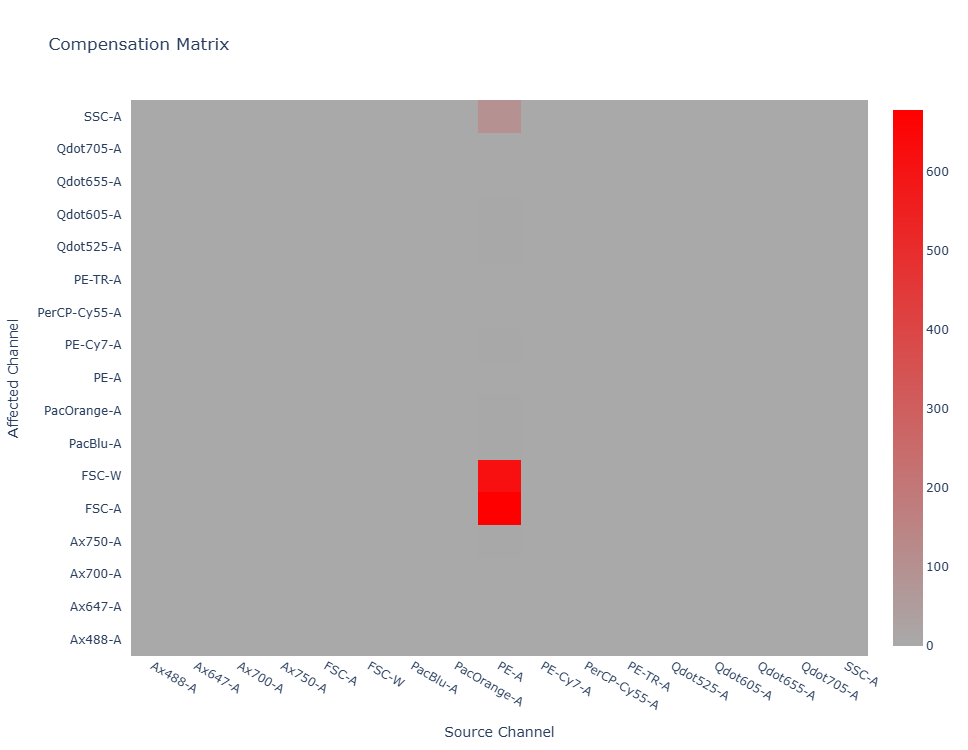

In [98]:
fig = plot_compensation_matrix(get_compensation_matrix(comps), colorscale=[[0, 'darkgrey'], [1.0, 'red']], show=False)
fig

The relationship between the two channels shows partial signal association, although the correlation remains relatively weak.

This visualization illustrates how spillover can be estimated empirically from single-stain controls before constructing a compensation matrix.

### Channel histograms

In [79]:
def plot_channel_histograms(
        sample: DataFrame|Sample, 
        title: str = None, 
        n_cols: int = 2, 
        n_markers: int = None,
        n_bins: int = 20,
        show_text: bool=False,
        show: bool = True,
    ) -> go.Figure|None:
    if isinstance(sample, DataFrame):
        df = sample
    else:
        df = flatten_df(sample.as_dataframe(source='raw'))
    marker_channels = list(df.columns)
    n_markers = n_markers or len(marker_channels)
    marker_channels = marker_channels[:n_markers]
    n_rows = math.ceil(n_markers / n_cols)
    fig = make_subplots(
        rows = n_rows,
        cols = n_cols,
        subplot_titles=marker_channels
    )
    for i, channel in enumerate(marker_channels):
        row = (i // n_cols) + 1
        col = (i % n_cols) + 1
        counts, bins = np.histogram(df[channel], bins=n_bins)
        fig.add_trace(
            go.Bar(
                x = (bins[:-1] + bins[1:]) / 2,
                y = counts,
                text = counts if show_text else None,
                textposition = 'outside' if show_text else None,
                showlegend = False,
                name = channel
            ),
            row = row,
            col = col,
        )
    fig.update_layout(
        height = 400 * n_rows,
        margin = dict(t=200),
        width = 1000,
        title = title or f'Marker signal distributions',
        template = f'plotly_{PLOTLY_THEME}'
    )
    if show:
        fig.show()
    else:
        return fig


In [80]:
outlier_demo_threshold = 0.975
demo_data = data.copy()
for col in data.select_dtypes(include=np.number).columns:
    low = demo_data[col].quantile(1 - outlier_demo_threshold)
    high = demo_data[col].quantile(outlier_demo_threshold)
    demo_data = demo_data[
        (demo_data[col] >= low) &
        (demo_data[col] <= high)
    ]

The distributions remain strongly asymmetric even after aggressive quantile-based filtering.

This type of filtering is shown here primarily for visualization purposes and is not representative of standard cytometry preprocessing workflows, which usually rely more heavily on biological gating and nonlinear signal transformations such as logicle or arcsinh scaling.

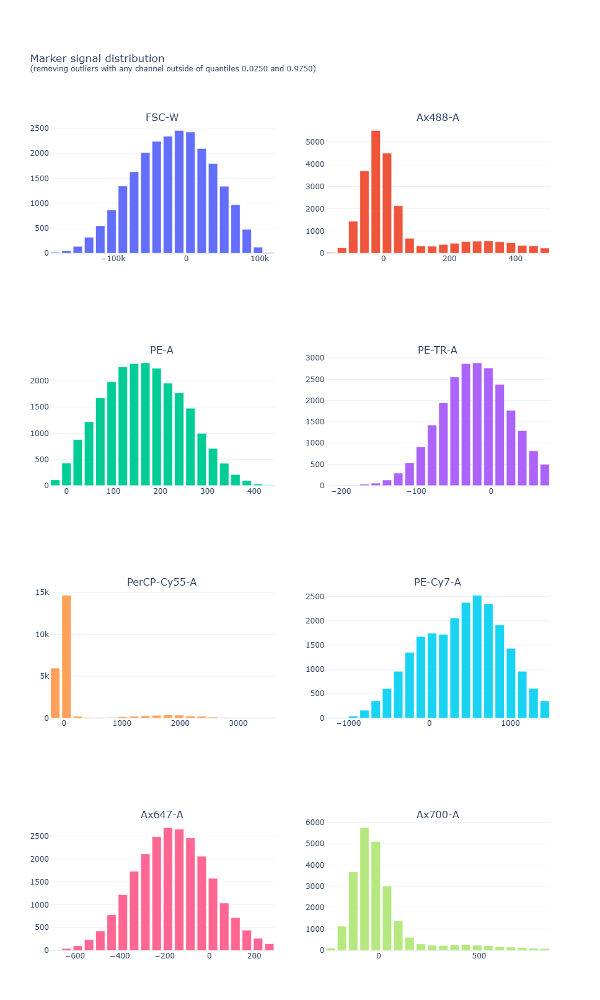

In [81]:
plot_channel_histograms(
    sample = demo_data,
    title = (
        f'Marker signal distribution <br>'
        f'<sup>(removing outliers with any channel outside of quantiles {1-outlier_demo_threshold:.4f} and {outlier_demo_threshold:.4f})</sup>'
    ),
    n_markers = 8,
    show_text = False,
    n_bins = 20,
)

# Machine Learning Analysis

## Preprocessing

In [22]:
x = np.linspace(-100, 100, 100)
y = np.arcsinh(x/3)
arcsinh_fig = go.Figure(data=go.Scatter(x=x, y=y, mode='lines', showlegend=False)).update_layout(template=f'plotly_{PLOTLY_THEME}', margin=dict(t=10, b=50))

### Fluorescence signal transformation

Raw fluorescence intensities in cytometry are highly skewed and span several orders of magnitude. Before applying machine learning methods, fluorescence channels are commonly transformed using the inverse hyperbolic sine (arcsinh) transform:

$$
y = \operatorname{arcsinh}\left(\frac{x}{c}\right)
$$

where:
- $x$ is the raw fluorescence intensity,
- $c$ is a cofactor controlling compression strength.

The arcsinh transform behaves approximately linearly near zero and logarithmically for large values. Unlike a standard logarithm, it also handles compensated negative values correctly, making it particularly suitable for flow and mass cytometry data.

The analytical definition of the inverse hyperbolic sine is:

$$
\operatorname{arcsinh}(x)=\ln\left(x+\sqrt{x^2+1}\right)
$$

The following figure illustrates the shape of the arcsinh transform and its progressive compression of large signal values.

Arcsinh and related nonlinear transformations became standard in modern cytometry workflows because they improve visualization, stabilize variance, and facilitate downstream clustering and dimensionality reduction.

Relevant references include:
- Finak G. et al. *Optimizing transformations for automated, high throughput analysis of flow cytometry data* (2010)
- Howard M. Shapiro, *Practical Flow Cytometry* (2003)

In [23]:
arcsinh_fig.show()

The following figure shows that the influence of the arcsinh cofactor decreases progressively for larger values. While small cofactors strongly affect the transformed signal range, increasing the cofactor beyond a certain point produces more moderate changes in the effective distribution width.

To reduce sensitivity to extreme outliers and acquisition artifacts, the transformed range is estimated here using robust quantiles rather than absolute minimum and maximum values.

This suggests that cofactor selection is relatively robust once a reasonable compression regime has been reached. In practice, the cofactor is often chosen empirically by evaluating how well downstream visualizations and machine learning methods separate cellular populations (here 250)

In [24]:
c_values = np.linspace(1, 500, 100)
y_deltas = []
for c in c_values:
    y_low, y_high = float('+inf'), float('-inf')
    for channel in features:
        y = np.arcsinh(data[channel].values/c)
        y_low = min(y_low, np.quantile(y, 0.05))
        y_high = max(y_high, np.quantile(y, 0.95))
    y_deltas.append(y_high-y_low)
cofactor_fig = go.Figure(
    data = go.Scatter(x=c_values, y=y_deltas, mode='lines', showlegend=False),
    layout = dict(
        xaxis_title = f'<i>c</i>',
        yaxis_title = f'<i>y</i><sub>95%</sub> - <i>y</i><sub>5%</sub>',
        template = f'plotly_{PLOTLY_THEME}', 
    ),
)
cofactor_fig.show()

The following summary compares the statistical ranges of each channel before and after transformation.

In [25]:
cofactor = 250  # common flow cytometry default for moderate signal compression
transformed_data = data[features].copy()
for channel in features:
    transformed_data[channel] = np.arcsinh(transformed_data[channel].values/cofactor)
default_format = pd.options.display.float_format = '{:.2f}'.format
pd.options.display.float_format = '{:.2f}'.format
display(pd.concat(
    {
        'original data': data[features].agg(['min', 'mean', 'std', 'max']).T,
        'transformed data': transformed_data[features].agg(['min', 'mean', 'std', 'max']).T,
    },
    axis=1
))
default_format = pd.options.display.float_format = default_format

original data                                 transformed data  \
                       min       mean        std       max              min   
Ax488-A          -14579.68    -235.98     845.16  18703.59            -4.76   
Ax647-A          -72276.67   -1718.05    4119.25  21753.93            -6.36   
Ax700-A          -19338.89    -356.83    1235.91  10721.16            -5.04   
Ax750-A          -97873.08   -2335.65    5766.24  12022.91            -6.66   
FSC-W         -29696691.24 -698523.58 1732188.51 276070.23           -12.38   
PE-A               -322.00    1264.62    2798.46  48027.00            -1.07   
PE-Cy7-A        -139768.16   -2965.12    8529.05   4488.87            -7.02   
PE-TR-A           -6160.68    -166.40     384.47   2811.59            -3.90   
PacBlu-A        -110522.38   -2118.95    7220.31 257366.73            -6.78   
PacOrange-A      -92320.34   -2305.24    5445.70  33417.08            -6.60   
PerCP-Cy55-A     -10634.16     142.04    1376.91  13470.71            -4.44   
Qdot525-A       -160842.27   -3826.03    9666.73 112290.89            -7.16   
Qdot605-A       -156197.75   -4045.39    9115.56   7906.04            -7.13   
Qdot655-A        -30038.13    -757.98    1782.43  14170.67            -5.48   
Qdot705-A        -22478.24    -267.84    1656.18  22350.54            -5.19   

                              
              mean  std  max  
Ax488-A      -0.21 1.17 5.01  
Ax647-A      -1.04 1.61 5.16  
Ax700-A      -0.32 1.40 4.45  
Ax750-A      -0.93 1.87 4.57  
FSC-W        -2.35 6.50 7.70  
PE-A          1.13 1.31 5.95  
PE-Cy7-A     -0.05 2.48 3.58  
PE-TR-A      -0.37 0.74 3.12  
PacBlu-A     -0.16 2.62 7.63  
PacOrange-A  -1.17 1.69 5.59  
PerCP-Cy55-A  0.03 1.58 4.68  
Qdot525-A    -0.92 2.25 6.80  
Qdot605-A    -1.76 1.73 4.15  
Qdot655-A    -0.75 1.26 4.73  
Qdot705-A    -0.22 1.68 5.19

### Feature scaling

After arcsinh transformation, fluorescence channels still exhibit different numerical ranges and variances. Many machine learning algorithms are sensitive to feature scale and may overweight channels with larger variance.

To reduce this effect, the transformed features are standardized using z-score normalization:

$$
z = \frac{x - \mu}{\sigma}
$$

where:
- $x$ is the transformed feature value,
- $\mu$ is the feature mean,
- $\sigma$ is the feature standard deviation.

This scaling step centers each channel around zero with unit variance, improving comparability across channels before dimensionality reduction and clustering.

In [26]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaled_data = pd.DataFrame(
    scaler.fit_transform(transformed_data),
    columns=transformed_data.columns,
    index=transformed_data.index,
)

The following summary compares the statistical ranges of each channel before and after scaling.

In [27]:
display(pd.concat(
    {
        'transformed data': transformed_data.agg(['min', 'mean', 'std', 'max']).T,
        'scaled data': scaled_data.agg(['min', 'mean', 'std', 'max']).T,
    },
    axis=1
))


transformed data                 scaled data                
                          min  mean  std  max         min  mean  std  max
Ax488-A                 -4.76 -0.21 1.17 5.01       -3.89 -0.00 1.00 4.47
Ax647-A                 -6.36 -1.04 1.61 5.16       -3.30 -0.00 1.00 3.85
Ax700-A                 -5.04 -0.32 1.40 4.45       -3.36  0.00 1.00 3.41
Ax750-A                 -6.66 -0.93 1.87 4.57       -3.07  0.00 1.00 2.94
FSC-W                  -12.38 -2.35 6.50 7.70       -1.54 -0.00 1.00 1.55
PE-A                    -1.07  1.13 1.31 5.95       -1.67  0.00 1.00 3.68
PE-Cy7-A                -7.02 -0.05 2.48 3.58       -2.82  0.00 1.00 1.47
PE-TR-A                 -3.90 -0.37 0.74 3.12       -4.79 -0.00 1.00 4.75
PacBlu-A                -6.78 -0.16 2.62 7.63       -2.53  0.00 1.00 2.97
PacOrange-A             -6.60 -1.17 1.69 5.59       -3.22 -0.00 1.00 4.01
PerCP-Cy55-A            -4.44  0.03 1.58 4.68       -2.83  0.00 1.00 2.94
Qdot525-A               -7.16 -0.92 2.25 6.80       -2.77 -0.00 1.00 3.43
Qdot605-A               -7.13 -1.76 1.73 4.15       -3.11 -0.00 1.00 3.42
Qdot655-A               -5.48 -0.75 1.26 4.73       -3.74  0.00 1.00 4.34
Qdot705-A               -5.19 -0.22 1.68 5.19       -2.97  0.00 1.00 3.23

## K-means clustering

K-means clustering partitions the cells into groups with similar signal profiles in the transformed high-dimensional feature space.

The algorithm attempts to minimize within-cluster variance by iteratively updating cluster centroids and assigning cells to their nearest centroid.

The number of clusters is estimated using the silhouette score.

The silhouette score measures how similar each observation is to its own cluster compared to neighboring clusters:
- values close to `1` indicate well-separated clusters,
- values near `0` indicate overlapping clusters,
- negative values suggest poor clustering assignments.

### Determining the k-value



The optimal number of clusters is selected empirically by maximizing the average silhouette score across a range of candidate values. To reduce computational cost, the silhouette score is evaluated on a random subset of the dataset controlled by the `eval_fraction` parameter.

In [99]:
eval_fraction = 0.1
# let's define the research space for the k-value
k_min = 2
k_max = 12
k_step = 1

In [100]:
eval_data = scaled_data.sample(int(eval_fraction*len(scaled_data)), random_state=42)

In [101]:
k_values = list(range(k_min, k_max+1, k_step))

silhouette_scores = []
for k in tqdm.tqdm(k_values, file=sys.stdout):
    kmeans = KMeans(
        n_clusters = k,
        random_state = 42,
        n_init = 'auto',
    )
    labels = kmeans.fit_predict(eval_data)
    score = silhouette_score(eval_data, labels)
    silhouette_scores.append(score)



100%|█████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:06<00:00,  1.72it/s]


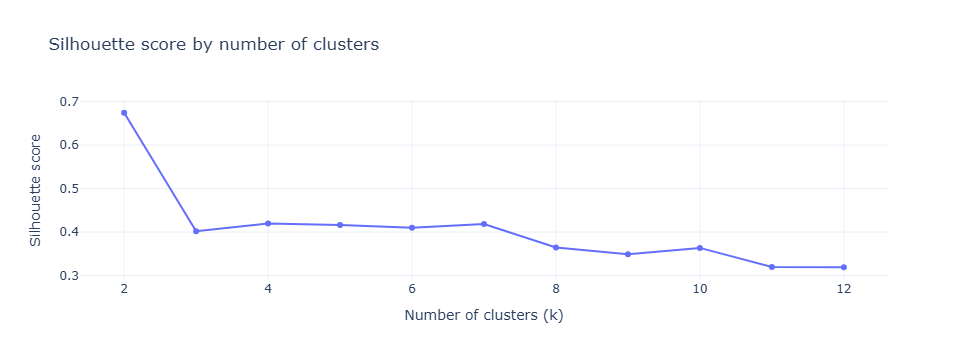

In [102]:
silhouette_fig = go.Figure(
    data = go.Scatter(
        x = list(k_values),
        y = silhouette_scores,
        mode = 'lines+markers',
        showlegend = False,
    ),
    layout = dict(
        title = f'Silhouette score by number of clusters',
        xaxis_title = 'Number of clusters (k)',
        yaxis_title = 'Silhouette score',
        template = f'plotly_{PLOTLY_THEME}',
    )
)

silhouette_fig.show()

Although the silhouette score is maximal for `k=2`, this solution produces only a very coarse partition of the cellular populations.

A larger value (`k=4`) was selected to obtain a more biologically informative clustering while preserving reasonably strong cluster separation.

In [103]:
N_CLUSTERS = 4

### Final clustering model

In [104]:
kmeans = KMeans(
    n_clusters = N_CLUSTERS,
    random_state = 42,
    n_init = 'auto',
)
cluster_labels = kmeans.fit_predict(scaled_data)

In [105]:
clustered_data = scaled_data.copy()
clustered_data['cluster'] = cluster_labels + 1

### UMAP projection

Uniform Manifold Approximation and Projection (UMAP) is used to project the high-dimensional cytometry data into a two-dimensional space suitable for visualization.

Unlike K-means clustering, which operates in the original transformed feature space, UMAP is primarily used here as a visualization tool. Cellular events positioned close together in the projection tend to exhibit similar fluorescence profiles in the original high-dimensional space.

The cluster labels obtained from K-means are used to color the UMAP projection and facilitate interpretation of the discovered cellular populations.

In [106]:
umap_fraction = 0.1

D:\projects\cyto2\venv3.11\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


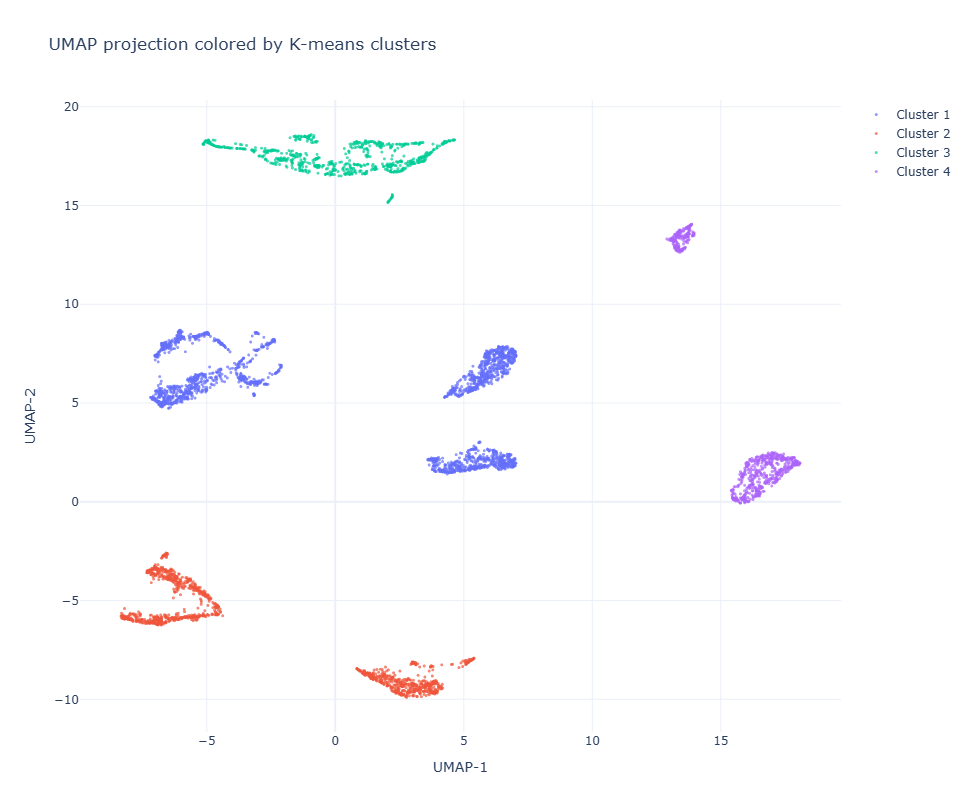

In [107]:
umap_model = umap.UMAP(
    n_components=2,
    random_state=42,
)
umap_df = clustered_data.sample(min(len(clustered_data), int(umap_fraction*len(clustered_data))), random_state=42)
umap_embedding = umap_model.fit_transform(umap_df[list(clustered_data)])
umap_df['UMAP-1'] = umap_embedding[:, 0]
umap_df['UMAP-2'] = umap_embedding[:, 1]

umap_fig = go.Figure()
for cluster, cluster_df in umap_df.groupby('cluster', sort=True):
    umap_fig.add_trace(
        go.Scattergl(
            x = cluster_df['UMAP-1'],
            y = cluster_df['UMAP-2'],
            mode = 'markers',
            name = f'Cluster {cluster}',
            marker = dict(
                size = 3,
                opacity = 0.7,
            ),
        )
    )

umap_fig.update_layout(
    title = 'UMAP projection colored by K-means clusters',
    xaxis_title = 'UMAP-1',
    yaxis_title = 'UMAP-2',
    template = f'plotly_{PLOTLY_THEME}',
    height = 800,
    width = 1000,
)

umap_fig.show()

The clustering seperates in four populations of unqual sizees.

In [108]:
cluster_counts = clustered_data.cluster.value_counts().sort_index().reset_index()

cluster_counts_fig = go.Figure(
    data = go.Bar(
        x = [f'Cluster {c}' for c in cluster_counts['cluster']],
        y = cluster_counts['count'],
        marker = dict(color=['#636efa', '#EF553B', '#00cc96', '#FFCC99', '#19d3f3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52'][:len(cluster_counts)]),
        text = cluster_counts['count'],
        textposition = 'outside',
    ),
    layout = dict(
        title = 'Number of cells per cluster',
        height = 500,
        xaxis_title = 'Cluster',
        yaxis_title = 'Number of cells',
        template = f'plotly_{PLOTLY_THEME}',
    ),
)
cluster_counts_fig.show()

## Cluster interpretation

After clustering, the average marker expression profile of each cluster can be analyzed to identify enriched fluorescence channels and characterize the corresponding cellular populations.

This exploratory analysis provides a first approximation of the biological differences between clusters.

### Marker enrichment

In [109]:
def plot_enrichment(agg: callable, name=None) -> DataFrame:
    groups = clustered_data.groupby('cluster')[features]
    marker_enrichment = agg(groups).sort_index(ascending=False)
    marker_enrichment_fig = go.Figure(
        data = go.Heatmap(
            x = marker_enrichment.columns,
            y = [f'Cluster {i}  ' for i in marker_enrichment.index],
            z = marker_enrichment.values,
            colorscale = [[0, 'darkgrey'], [1.0, 'red']],
            xgap = 1,
            ygap = 1,
        )
    )
    marker_enrichment_fig.update_layout(
        title = 'Marker enrichment by cluster' if name is None else f'Marker {name} values by cluster',
        xaxis_title = 'Marker',
        yaxis_title = 'Cluster',
        template = f'plotly_{PLOTLY_THEME}',
        height = 500,
    )   
    marker_enrichment_fig.show()
    return marker_enrichment, marker_enrichment_fig

The following table summarizes the average transformed and scaled marker expression for each cluster.

Positive values indicate that a cluster expresses a marker above the global average, while negative values indicate relatively lower expression.

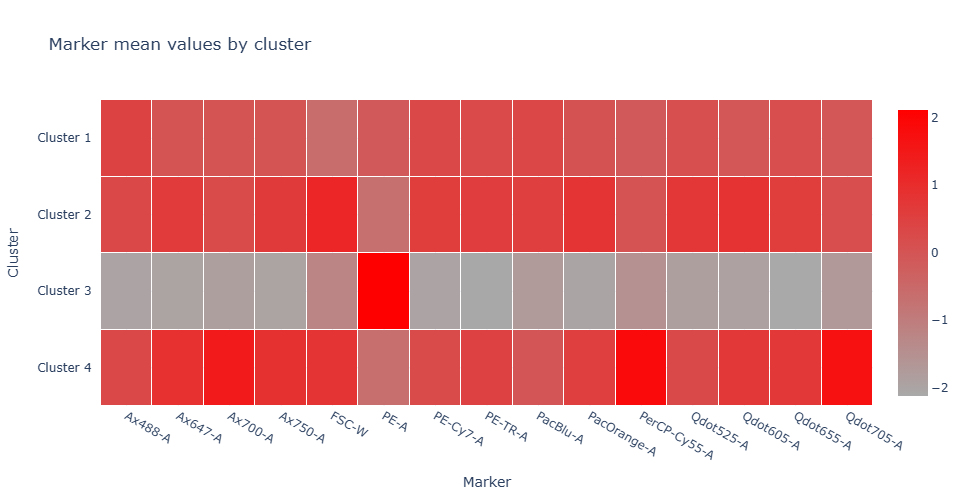

In [117]:
_, fig = plot_enrichment(lambda g: g.mean(), name='mean')

Although the average marker expression profiles remain relatively similar across clusters, Cluster 3 exhibits noticeably increased `PE-A` expression compared to the other populations.

Interestingly, this enrichment is not associated with a clearly isolated region in the UMAP projection. This suggests that the corresponding biological variation may be driven primarily by localized differences in marker intensity rather than by a strong global restructuring of the high-dimensional feature space.

To further explore intra-cluster variability, violin plots are displayed for the first six fluorescence channels. These visualizations provide a more detailed view of marker distribution shapes, density, and dispersion within each cellular population.

In [111]:
N_MARKERS_TO_PLOT = 6
markers_to_plot = features[:N_MARKERS_TO_PLOT]
violin_fig = make_subplots(
    rows = len(markers_to_plot),
    cols = 1,
    shared_xaxes = True,
    subplot_titles = markers_to_plot,
    vertical_spacing = 0.03,
)
for i, marker in enumerate(markers_to_plot):
    for c, (cluster, cluster_df) in enumerate(clustered_data.groupby('cluster')):
        violin_fig.add_trace(
            go.Violin(
                x = [f'Cluster {cluster}'] * len(cluster_df),
                y = cluster_df[marker],
                name = f'Cluster {cluster}',
                box_visible = True,
                line = dict(color=['#636efa', '#EF553B', '#00cc96', '#FFCC99', '#19d3f3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52'][c]),
                meanline_visible = True,
                showlegend = i==0,
            ),
            row = i+1,
            col = 1,
        )
violin_fig.update_layout(
    title = 'Marker distributions across clusters',
    template = f'plotly_{PLOTLY_THEME}',
    height = 300 * len(markers_to_plot),
    width = 1000,
)

The violin plots suggest that Cluster 3 tends to exhibit narrower and more concentrated marker distributions than the other populations, which may indicate lower variability within the cluster.

Because some channels contain skewed distributions and extreme values, standard deviation can sometimes give a misleading impression of dispersion. To obtain a more robust estimate of distribution spread, the interquartile range (IQR) is computed for each marker and cluster:

$$
IQR = Q_{75} - Q_{25}
$$

where:
- $Q_{25}$ is the 25th percentile,
- $Q_{75}$ is the 75th percentile.

The IQR measures the spread of the central 50% of the distribution and is substantially less sensitive to outliers than the standard deviation.

Although the reduction in variability is not uniform across all markers, Cluster 3 appears to exhibit a general tendency toward lower IQR values compared to the other populations.

To evaluate this global trend more quantitatively, the average IQR across all analyzed features is computed for each cluster.

In [112]:
enrichment, _ = plot_enrichment(lambda g: g.quantile(.75)-g.quantile(.25), name='IQR')

In [113]:
mean_iqr = enrichment.T.mean().sort_index(ascending=True).reset_index().rename(columns={0: 'mean IQR'})
display(mean_iqr.style.hide(axis='index'))

cluster,mean IQR
1,0.535718
2,0.446696
3,0.320706
4,0.586713


The average IQR analysis quantitatively confirms the visual impression previously observed in the violin plots: Cluster 3 exhibits globally reduced variability compared to the other populations.

This increased homogeneity may reflect a more tightly regulated cellular state or a more specialized biological population, suggesting that the cluster could warrant further biological investigation.

### Experimental condition analysis

To investigate whether the experimental stimulation conditions influence cellular population structure, the distribution of cells across clusters is compared between samples.

The following heatmap summarizes the number of cellular events assigned to each cluster for every experimental condition.

In [114]:
clustered_data['condition'] = data['condition'] # recuperate condition stored in data from the file names

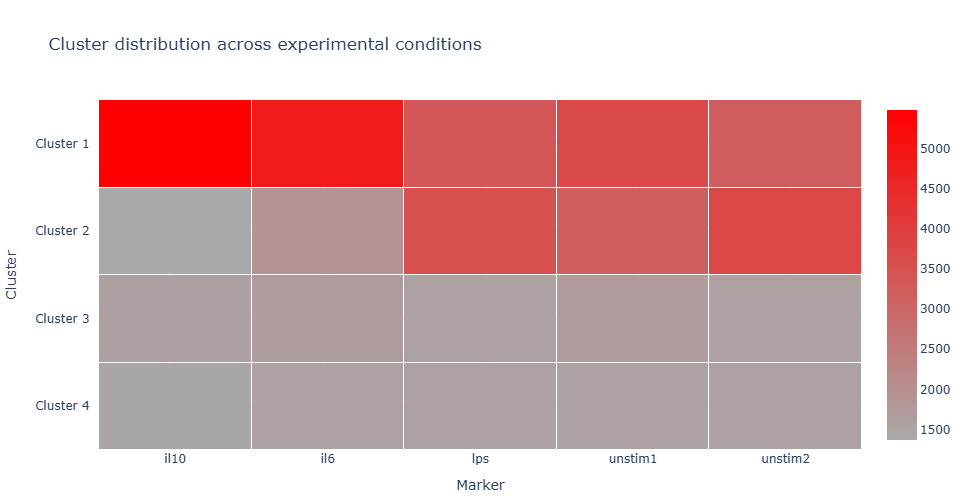

In [116]:
counts = []
for cluster, cluster_df in clustered_data.groupby('cluster'):
    df = cluster_df.condition.value_counts().reset_index().set_index('condition').rename(columns=dict(count=cluster))
    counts.append(df)
df = pd.concat(counts, axis=1).T
df.index.name = 'Cluster'
df = df.sort_index(ascending=False)
df = df[sorted(list(df))]
go.Figure(
    data = go.Heatmap(
        x = df.columns,
        y = [f'Cluster {i}  ' for i in df.index],
        z = df,
        colorscale = [[0, 'darkgrey'], [1.0, 'red']],
        xgap = 1,
        ygap = 1,
    ),
    layout = dict(
        title = 'Cluster distribution across experimental conditions',
        xaxis_title = 'Marker',
        yaxis_title = 'Cluster',
        template = f'plotly_{PLOTLY_THEME}',
        margin = dict(b=10),
        height = 500,
    ),
).show()#condition_cluster_heatmap

The cluster distributions appear to vary substantially across experimental conditions. In particular, Cluster 1 is more strongly represented in the `IL10` and `IL6` samples, whereas Cluster 2 appears relatively enriched in the `LPS` and unstimulated conditions.

Although this analysis remains exploratory, these differences suggest that the stimulation conditions may influence the abundance of specific cellular states or populations identified by the clustering workflow.

# Conclusion

This notebook explored a complete exploratory machine learning workflow for flow cytometry data analysis using Python and FlowKit.

The workflow included:
- loading and harmonizing `.fcs` cytometry files,
- reconstructing fluorescence compensation from single-stain controls,
- fluorescence signal transformation using the arcsinh transform,
- feature scaling,
- unsupervised clustering,
- UMAP visualization,
- exploratory marker enrichment analysis,
- and comparison of cluster composition across experimental conditions.

The analysis showed that simple clustering approaches such as K-means may struggle to capture the nonlinear manifold structure of cytometry data when applied directly in the original feature space. Clustering performed in the UMAP embedding space produced more visually coherent cellular populations and facilitated exploratory interpretation.

Several exploratory observations emerged from the analysis:
- Cluster 3 exhibited reduced variability across multiple markers,
- `PE-A` expression appeared enriched in Cluster 3 despite limited separation in the UMAP projection,
- and experimental stimulation conditions appeared associated with changes in cluster abundance.

These results remain exploratory and should not be interpreted as definitive biological conclusions. Several limitations remain in the current workflow:
- compensation reconstruction was simplified,
- no expert biological gating was applied,
- clustering was performed without external labels,
- and no statistical hypothesis testing was conducted.

Possible future improvements could include:
- graph-based clustering methods such as Leiden or FlowSOM,
- more robust compensation workflows,
- supervised classification approaches,
- biological annotation of marker identities,
- and integration of additional experimental datasets.

Overall, this project demonstrates how modern machine learning workflows can be combined with flow cytometry preprocessing and exploratory visualization techniques to investigate high-dimensional single-cell biological data.

If you read up to that point, congrats, you're the best!